In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

## 1.1 Accessing and Modifying pixel values

In [6]:
img = cv.imread('dataImage/messi5.jpg')
img_RGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

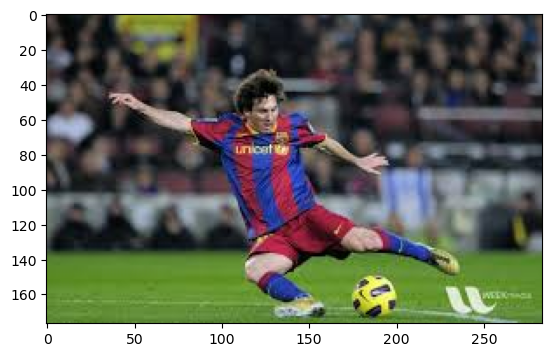

In [30]:
plt.imshow(img_RGB)

In [8]:
px = img_RGB[100,100]
print( px )

[ 72  51 130]


In [11]:
red = img_RGB[100,100,0] #Convert RGB
print( red )

72


In [14]:
img_RGB[100:105,100:105] = [255,255,255]
print(img_RGB[100,100])



[255 255 255]


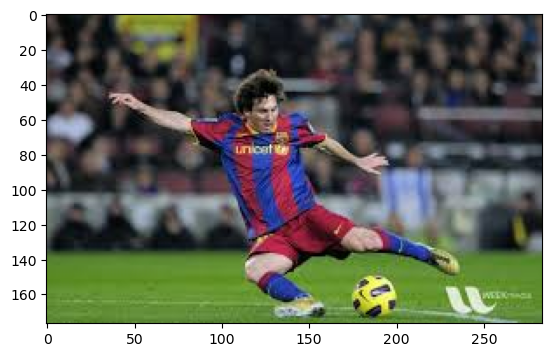

In [31]:
plt.imshow(img_RGB)

In [16]:
img_RGB.item(10,10, 2) #RGB - blue channel 


87

In [17]:
img_RGB.itemset((10,10,2),100) 
img_RGB.item(10,10,2)

100

### Image addition 

In [18]:
x = np.uint8([250])
y = np.uint8([10])
print( cv.add(x,y) )    # 250+10 = 260 => 255
print( x+y )            # 250+10 = 260 % 256 = 4

[[260.]
 [  0.]
 [  0.]
 [  0.]]
[4]


### Add weight, substract image

In [21]:
image1 = cv.imread('dataImage/oldcity.jpg')  
image2 = cv.imread('dataImage/Galaxy.jpg') 
  
# cv.addWeighted is applied over the 
# image inputs with applied parameters 
weightedSum = cv.addWeighted(image1, 0.5, image2, 0.4, 0) 
  
# the window showing output image 
# with the weighted sum  
cv.imshow('Weighted Image', weightedSum) 
  
# De-allocate any associated memory usage   
if cv.waitKey(0) & 0xff == 27:  
    cv.destroyAllWindows()  

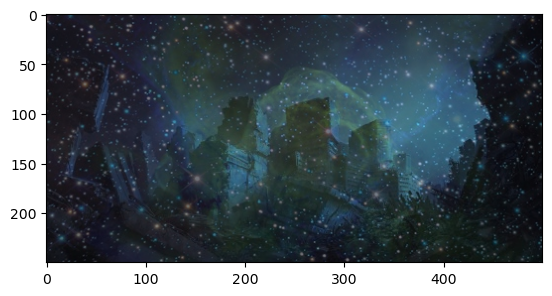

In [20]:
plt.imshow(weightedSum)

## Link 
https://learnopencv.com/image-rotation-and-translation-using-opencv/ - 2.7.1

In [27]:
print(img.shape)
print(177 * 188)
print(img.size)
print(img.dtype)

(177, 188, 3)
33276
99828
uint8


## 1.3 Image ROI


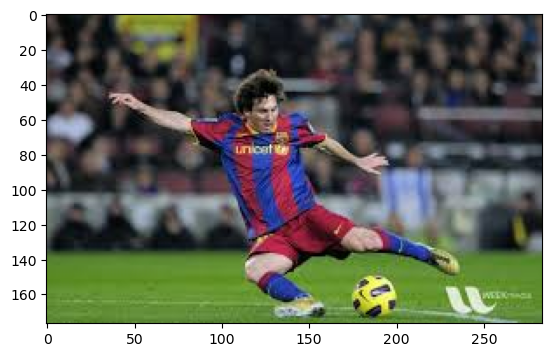

In [32]:
plt.imshow(img_RGB)

In [40]:
img_RGB.shape

(177, 284, 3)

In [47]:
# ball = img_RGB[180:210, 145:175] # Error
# img[50:80, 145:175] = ball 
# # ball

ball = img_RGB[145:175, 170:200]
img_RGB[145:175, 50:80] = ball
# ball

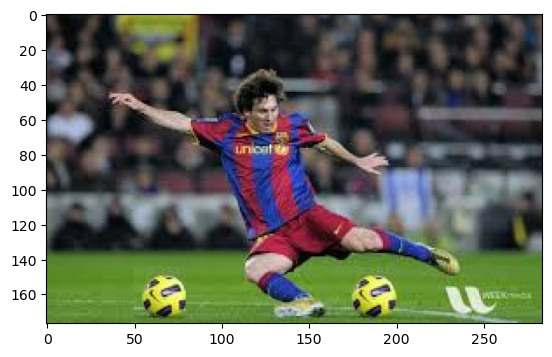

In [48]:
plt.imshow(img_RGB)

## Exercise 2.1
4. Extract the yellow balloon by creating a new image of only one balloon. 
Hint: Extract a rectangle ROI using a predefined position (check instructions) 
5. Extract the yellow balloon automatically by using HSV color space to extract only pixels 
of yellow color. 
Hint: Change into HSV color space, then filter the yellow pixels by keeping only pixels having a range of 
H-values of yellow (try to find the range by yourself) 

In [11]:
img = cv.imread('dataImage/ballons5.png')
img_RGB_ball = cv.cvtColor(img, cv.COLOR_BGR2RGB)

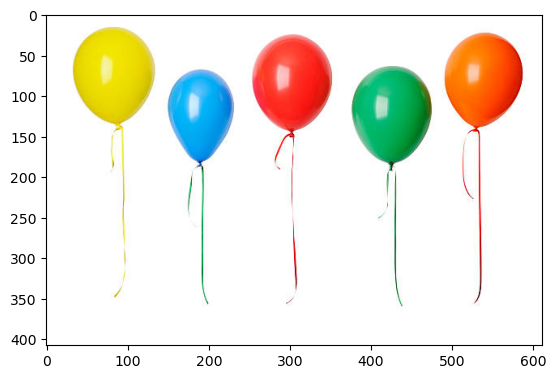

In [12]:
plt.imshow(img_RGB_ball)

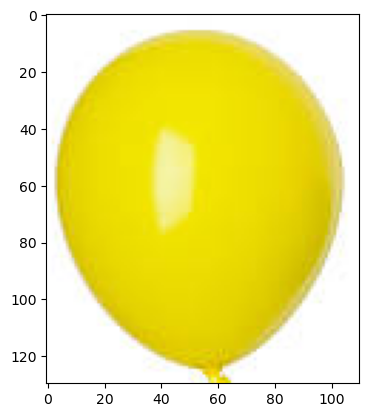

In [18]:
balloon_yellow = img_RGB_ball[10:140, 30:140]
# img_RGB[145:175, 50:80] = ball
# ball
plt.imshow(balloon_yellow)

In [46]:
# img = cv.imread('dataImage/ballons5.png')
# # Convert the image from BGR to HSV
# img_RGB_ball = cv.cvtColor(img, cv.COLOR_BGR2RGB)

img_RGB_ball = cv.cvtColor(cv.imread('dataImage/ballons5.png'), cv.COLOR_BGR2RGB)
hsv = cv.cvtColor(img_RGB_ball, cv.COLOR_RGB2HSV)

# Define the range for yellow color in HSV
# The typical range for yellow in HSV can be around these values
lower_yellow = np.array([25, 50, 70])
upper_yellow = np.array([35, 255, 255])

# Create a mask for yellow color
mask = cv.inRange(hsv, lower_yellow, upper_yellow)

# Bitwise-AND mask and original image to extract yellow color
res = cv.bitwise_and(img_RGB_ball, img_RGB_ball, mask=mask)

# Display the original image, the mask, and the result
cv.imshow('Original Image', img_RGB_ball)
cv.imshow('Yellow Mask', mask)
cv.imshow('Extracted Yellow', res)



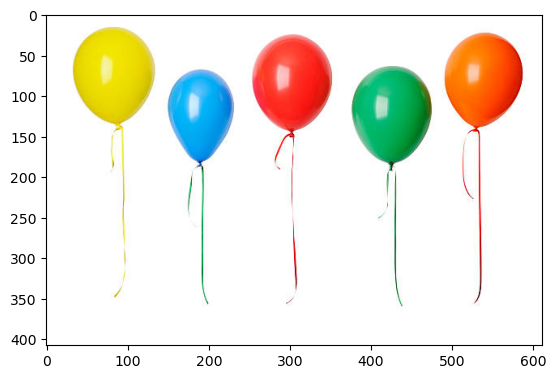

In [48]:

plt.imshow(img_RGB_ball)

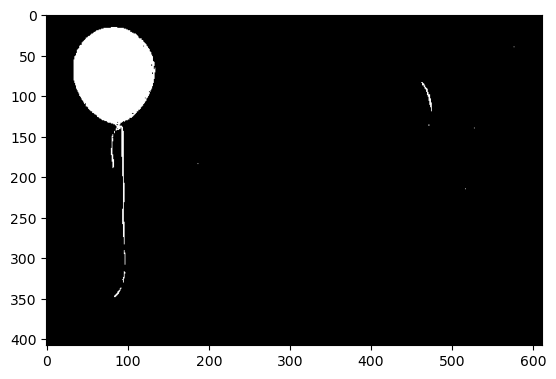

In [4]:
plt.imshow(mask, cmap='gray')

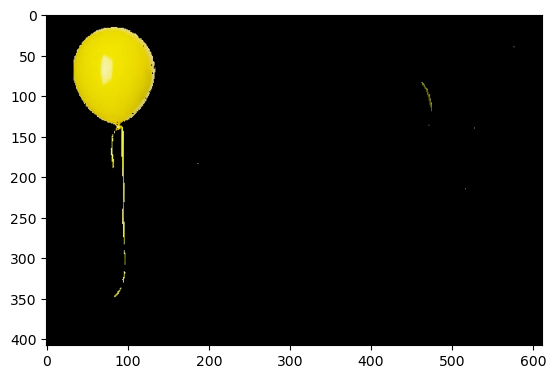

In [5]:
plt.imshow(res)


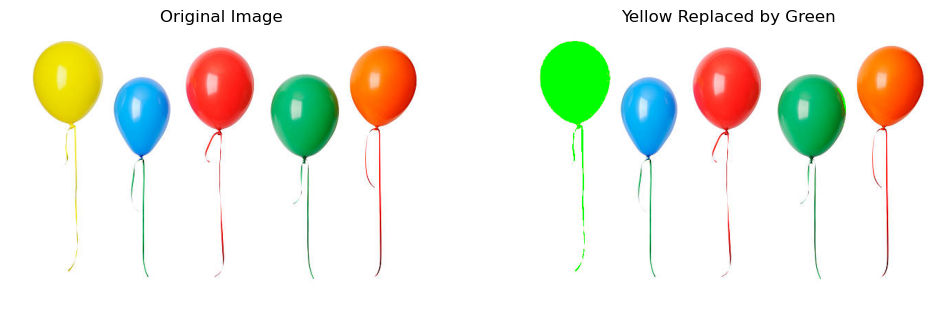

In [7]:
## Re-paint the yellow balloon by replacing the pixels of yellow by green. 
# Hint: Filter yellow pixels by HSV space and  
# replace the value of the pixels by new values (green color) 

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read the image and convert it to RGB
img = cv.imread('dataImage/ballons5.png')
img_RGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Convert the image from RGB to HSV
hsv = cv.cvtColor(img_RGB, cv.COLOR_RGB2HSV)

# Define the range for yellow color in HSV
lower_yellow = np.array([25, 50, 70])
upper_yellow = np.array([35, 255, 255])

# Create a mask for yellow color
mask = cv.inRange(hsv, lower_yellow, upper_yellow)

# Create a copy of the original image to modify
img_with_green_balloon = img_RGB.copy()

# Replace yellow pixels with green [0, 255, 0] in the original image
img_with_green_balloon[mask > 0] = [0, 255, 0]

# Display the original image and the modified image
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_RGB)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Yellow Replaced by Green')
plt.imshow(img_with_green_balloon)
plt.axis('off')

plt.show()



## 2.2 

In [10]:
imgfood = cv.imread('dataImage/food.jpg')
img_rgb_food = cv.cvtColor(img, cv.COLOR_BGR2RGB)

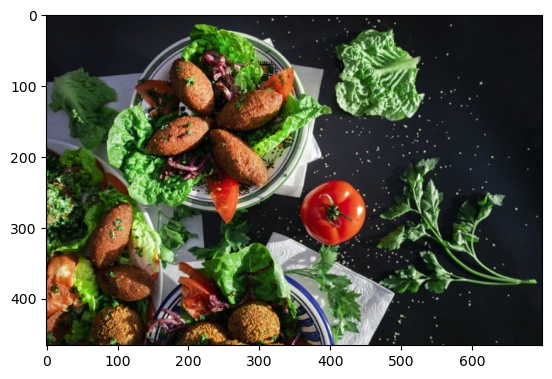

In [6]:
plt.imshow(img_rgb_food)

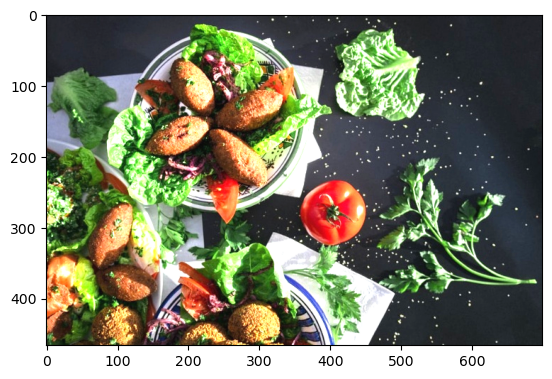

In [7]:
alpha = 1.5 # Contrast control
beta = 10 # Brightness control

# call convertScaleAbs function
adjusted = cv.convertScaleAbs(img_rgb_food, alpha=alpha, beta=beta)

plt.imshow(adjusted)

In [8]:


# Function to display images
def display_images(images, titles):
    plt.figure(figsize=(20, 10))
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(image, cmap='gray' if len(image.shape) == 2 else None)
        plt.title(title)
        plt.axis('off')
    plt.show()

# Function to increase brightness
def increase_brightness(image, value=30):
    hsv = cv.cvtColor(image, cv.COLOR_RGB2HSV)
    h, s, v = cv.split(hsv)
    v = cv.add(v, value)
    v[v > 255] = 255
    v[v < 0] = 0
    final_hsv = cv.merge((h, s, v))
    bright_img = cv.cvtColor(final_hsv, cv.COLOR_HSV2RGB)
    return bright_img

# Function for global histogram equalization
def global_histogram_equalization(image):
    img_yuv = cv.cvtColor(image, cv.COLOR_RGB2YUV)
    img_yuv[:, :, 0] = cv.equalizeHist(img_yuv[:, :, 0])
    equalized_img = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)
    return equalized_img

# Function for adaptive histogram equalization (CLAHE)
def adaptive_histogram_equalization(image):
    img_yuv = cv.cvtColor(image, cv.COLOR_RGB2YUV)
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])
    clahe_img = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)
    return clahe_img

# Function to plot histograms
def plot_histograms(image, title):
    colors = ('r', 'g', 'b')
    plt.figure(figsize=(10, 5))
    for i, color in enumerate(colors):
        hist = cv.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
        plt.xlim([0, 256])
    plt.title(title)
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

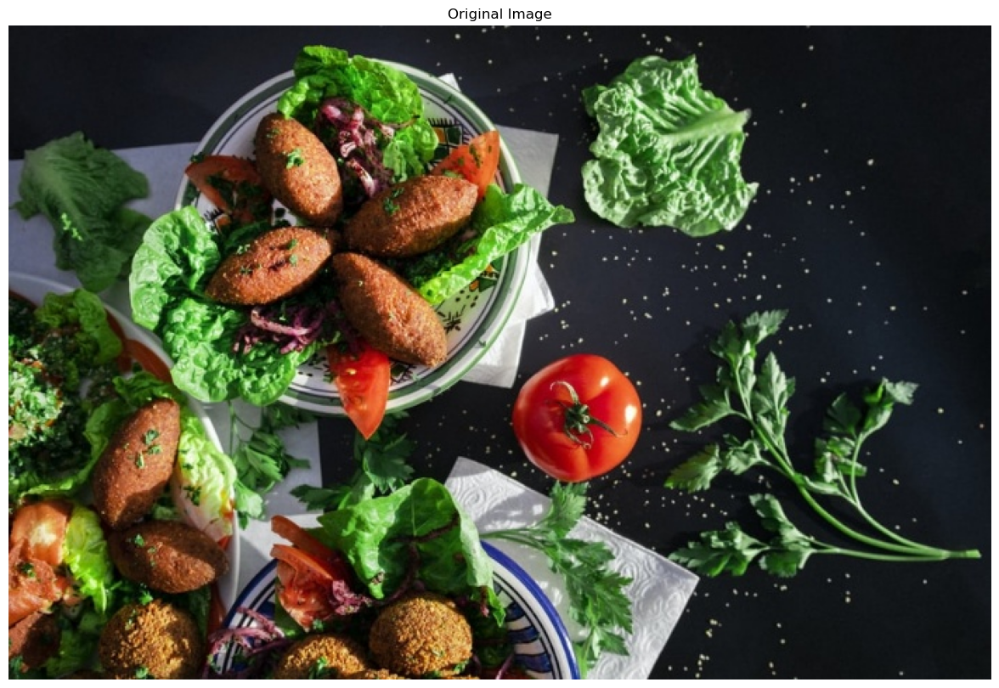

In [11]:
display_images([img_rgb_food], ["Original Image"])

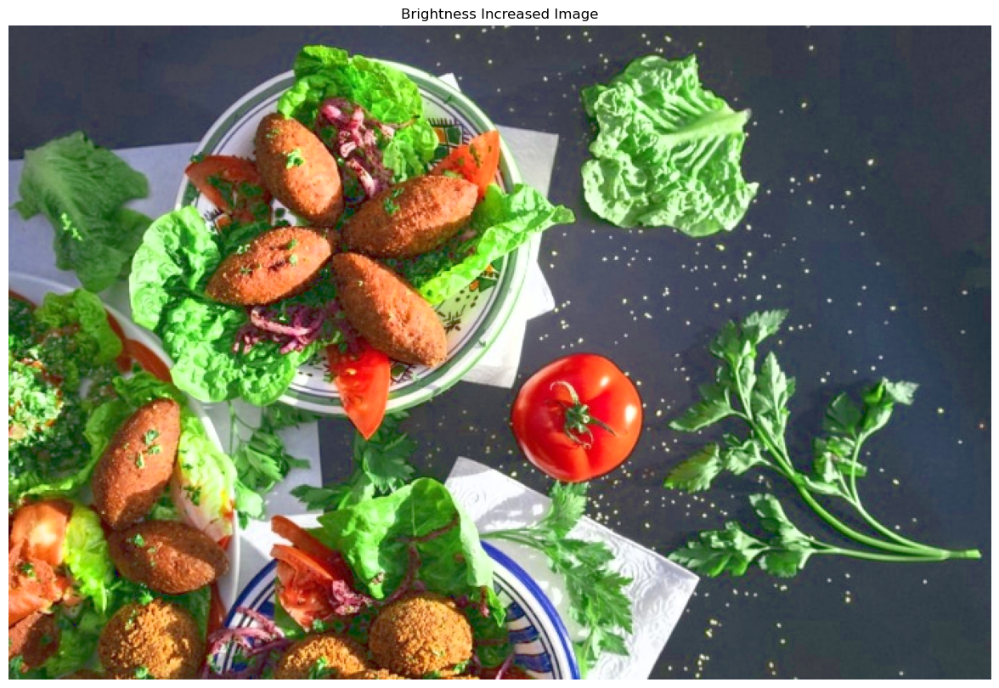

In [12]:

# Increase brightness
bright_img = increase_brightness(img_rgb_food, value=50)

# Display the brightness increased image
display_images([bright_img], ["Brightness Increased Image"])

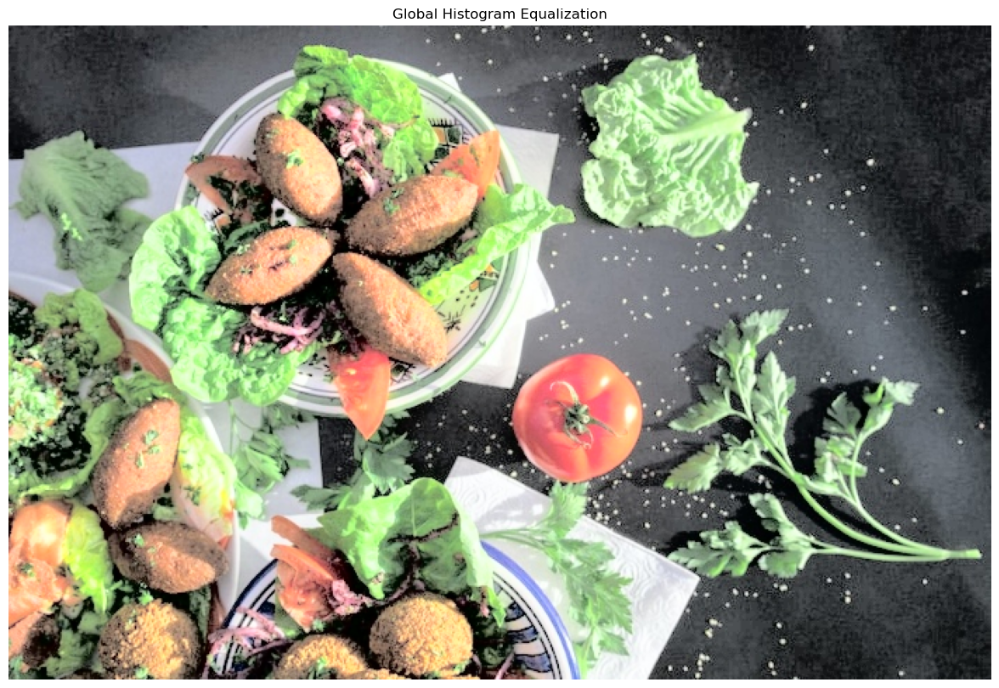

In [13]:

# Global histogram equalization
global_eq_img = global_histogram_equalization(img_rgb_food)

# Display the global histogram equalized image
display_images([global_eq_img], ["Global Histogram Equalization"])

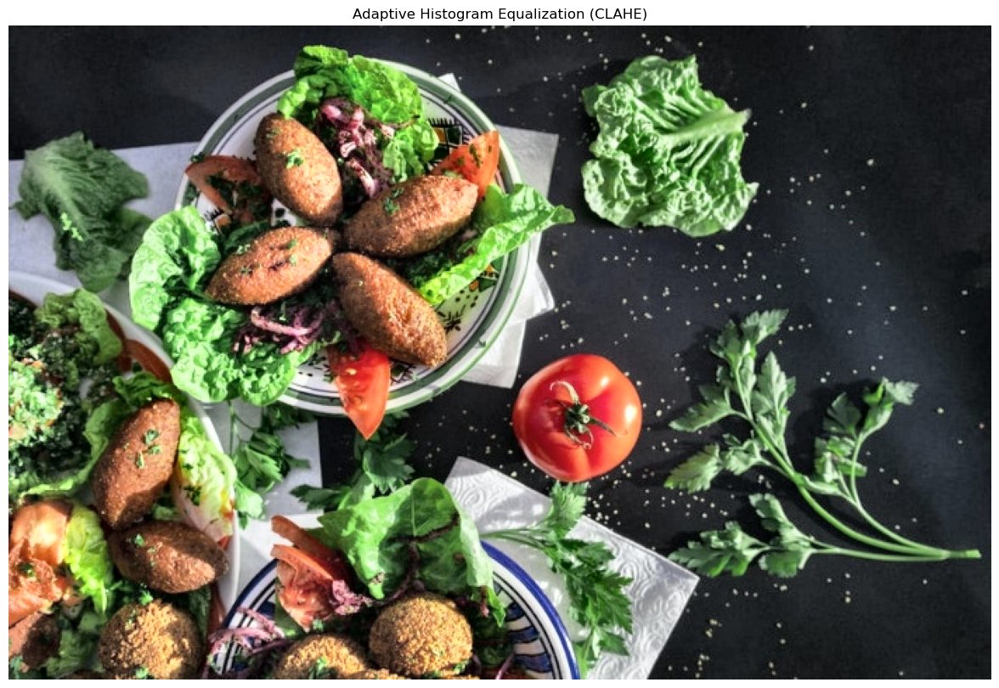

In [14]:
# Adaptive histogram equalization (CLAHE)
clahe_img = adaptive_histogram_equalization(img_rgb_food)

# Display the CLAHE image
display_images([clahe_img], ["Adaptive Histogram Equalization (CLAHE)"])
